# Préparez des données pour un organisme de santé publique

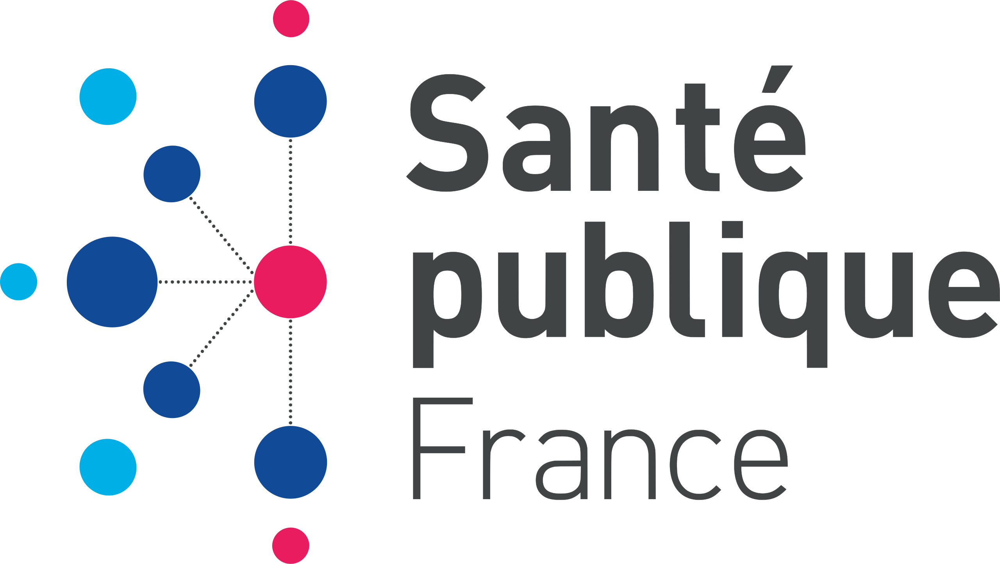



## 1. Introduction

L'agence Santé publique France souhaite améliorer sa base de données Open Food Facts qui permet de connaître la qualité nutritionnelle de leur produits.  
Ils souhaitent développer un système de suggestion ou d'auto-complétion pour remplir la base de données plus efficacement.

Mon rôle est de déterminer la faisabilité de cette application en analysant ces données et en produisants des graphiques compréhensible à tous.

**Données d'entrée**:
- [Tous les produits](https://s3-eu-west-1.amazonaws.com/static.oc-static.com/prod/courses/files/parcours-data-scientist/P2/fr.openfoodfacts.org.products.csv.zip)
- [Description de toutes les colonnes](https://world.openfoodfacts.org/data/data-fields.txt)

**Données de sortie**: 
- Rapport d'exploration
- Conclusion sur la faisabilité de l'application.

<!---
Critères d'évaluation:
- Vous avez défini les objectifs de son nettoyage de données en fonction de la problématique métier
- Vous avez défini sa démarche de préparation et nettoyage des données
-->

---

Je remarque que le fichier ne contient aucune données qui entrerait en conflit avec les 5 principes du RGPD (Règlement Général sur la Protection des Données):
- **Le principe de finalité** : le responsable d'un fichier ne peut enregistrer et utiliser des informations sur des personnes physiques que dans un but bien précis, légal et légitime ;
- **Le principe de proportionnalité et de pertinence** : les informations enregistrées doivent être pertinentes et strictement nécessaires au regard de la finalité du fichier ;
- **Le principe d'une durée de conservation limitée** : il n'est pas possible de conserver des informations sur des personnes physiques dans un fichier pour une durée indéfinie. Une durée de conservation précise doit être fixée, en fonction du type d'information enregistrée et de la finalité du fichier ;
- **Le principe de sécurité et de confidentialité** : le responsable du fichier doit garantir la sécurité des informations qu'il détient. Il doit en particulier veiller à ce que seules les personnes autorisées aient accès à ces informations ;
- **Les droits des personnes**.

## Importation des données

Afin de lire, nettoyer, analyser et visualiser les données, j'utilise les librairies suivantes:
- Pandas, 
- NumPy,
- Seaborn,
- Scikit-learn,
- Matplotlib.

In [3]:
import os.path 
import pandas as pd
import numpy as np
import math  

from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer  
from sklearn.model_selection import GridSearchCV  
  
import seaborn as sns
import matplotlib.pyplot as plt

# Allow pandas to display all columns when displaying a table
pd.set_option("display.max_columns", None)

product_csv_path = '../input/fr.openfoodfacts.org.products.csv'
products = pd.read_csv(product_csv_path, sep='\t', low_memory=False)
products.head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces,traces_tags,traces_fr,serving_size,no_nutriments,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,ingredients_that_may_be_from_palm_oil_tags,nutrition_grade_uk,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,butyric-acid_100g,caproic-acid_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,lignoceric-acid_100g,cerotic-acid_100g,montanic-acid_100g,melissic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,elaidic-acid_100g,gondoic-acid_100g,mead-acid_100g,erucic-acid_100g,nervonic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,NaN,NaN,Ferme t'y R'nao,ferme-t-y-r-nao,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,en:FR,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"en:to-be-completed, en:nutrition-facts-to-be-c...","en:to-be-completed,en:nutrition-facts-to-be-co...","A compléter,Informations nutritionnelles à com...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,en:united-states,États-Unis,"Bananas, vegetable oil (coconut oil, corn oil ...",NaN,NaN,NaN,NaN,NaN,28 g (1 ONZ),NaN,0.0,[ bananas -> en:bananas ]

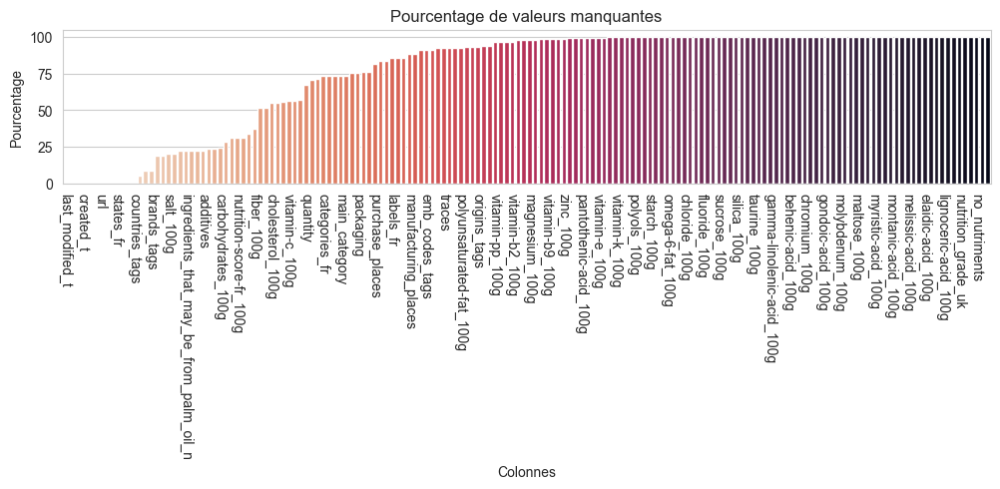

In [5]:
def create_percentage_missing_chart(df, xticksRange):
    # Get the missing data in percentage
    missing_data = df.isna().mean() * 100

    # Sort by value asc
    missing_data = missing_data.sort_values()

    # Create the figure
    plt.figure(figsize=(12, 2))

    ## Add horizontal lines
    sns.set_style('whitegrid')

    ## Set a color palette (https://seaborn.pydata.org/tutorial/color_palettes.html)
    colors = sns.color_palette("rocket_r", len(missing_data))

    ## Create the barplot
    sns.barplot(x=missing_data.index, y=missing_data,  palette=colors) # Create the bar plot

    ## Rotate the x labels and only one out of three for better readability
    plt.xticks(rotation=-90)
    plt.xticks(range(0, len(missing_data.index), xticksRange))

    ## Set the labels
    plt.ylabel('Pourcentage')
    plt.xlabel('Colonnes')
    plt.title('Pourcentage de valeurs manquantes')
    plt.show()
    
create_percentage_missing_chart(products, 3) 

J'observe les nombre de lignes et colonnes

In [2]:
products.shape

(320772, 162)

## 2. Nettoyage

<!-- Critères d'évaluation

- Vous avez éliminé les variables non pertinentes pour la problématique de l'application.

- Vous avez proposé et justifié au minimum trois méthodes de traitement des valeurs manquantes, adaptées aux variables concernées (médiane, mise à 0, IterativeImputer, KNN, suppression…). 

- Vous avez identifié, quantifié et traité les valeurs aberrantes de chaque variable, en tenant compte du contexte métier. 
- Vous avez traité les duplicats de variables et d'enregistrements. 

- Vous avez mis en œuvre une automatisation de certains traitements, à l'aide de fonctions et méthodes adaptées. 


- DONE - Vous avez veillé au respect des normes RGPD pendant les opérations de nettoyage. Dans ce projet cela signifie :
-- d’expliquer les 5 grands principes RGPD et de montrer que votre travail n’a pas de lien avec les RGPD.

-->

### 2.1 Valeurs manquantes

**Je vérifie les colonnes qui ont des valeurs manquantes**

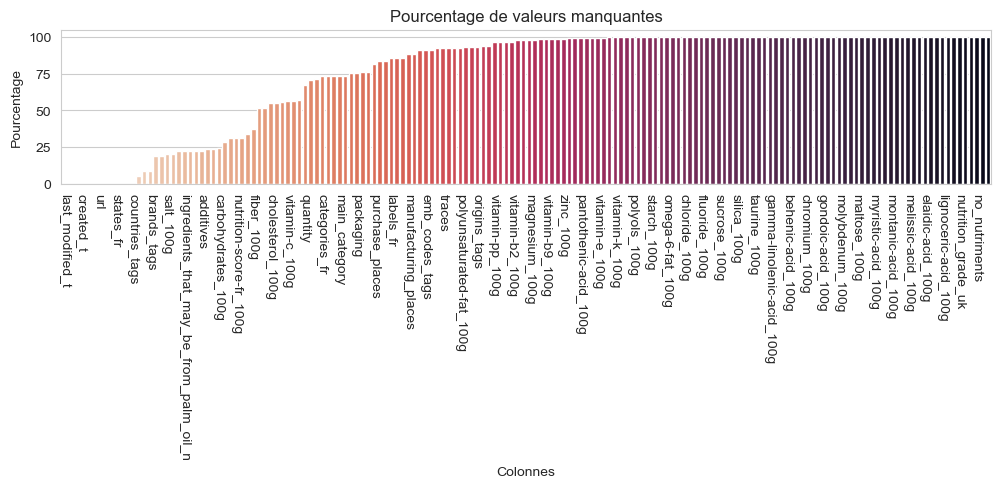

In [3]:
def create_percentage_missing_chart(df, xticksRange):
    # Get the missing data in percentage
    missing_data = df.isna().mean() * 100

    # Sort by value asc
    missing_data = missing_data.sort_values()

    # Create the figure
    plt.figure(figsize=(12, 2))

    ## Add horizontal lines
    sns.set_style('whitegrid')

    ## Set a color palette (https://seaborn.pydata.org/tutorial/color_palettes.html)
    colors = sns.color_palette("rocket_r", len(missing_data))

    ## Create the barplot
    sns.barplot(x=missing_data.index, y=missing_data,  palette=colors) # Create the bar plot

    ## Rotate the x labels and only one out of three for better readability
    plt.xticks(rotation=-90)
    plt.xticks(range(0, len(missing_data.index), xticksRange))

    ## Set the labels
    plt.ylabel('Pourcentage')
    plt.xlabel('Colonnes')
    plt.title('Pourcentage de valeurs manquantes')
    plt.show()
    
create_percentage_missing_chart(products, 3) 

Je remarque qu'il y a plus de la moitié des colonnes ont des données manquantes.  
L'objectif de l'application est de suggérer ou autocompléter les valeurs manquantes.  
Je décide de sélectionner les colonnes qui ont le plus de valeurs et qui répondent à un critère de santé pour fournir des suggestions pertinentes sur leur valeurs manquantes.

Je me base sur les critères d'évaluation du Nutri-Score depuis [le site d'OpenFoodFact](https://fr.openfoodfacts.org/nutriscore).

> La note Nutri-Score est déterminée par la quantité de nutriments bons et mauvais pour la santé :
>- **Points négatifs** : l'énergie, les graisses saturées, les sucres, et le sodium (des niveaux élevés sont considérés comme mauvais pour la santé)
>- **Points positifs** : la proportion de fruits, de légumes, de noix, d'huiles d'olive, de colza et de noix, de fibres et de protéines (les niveaux élevés sont considérés comme bons pour la santé).

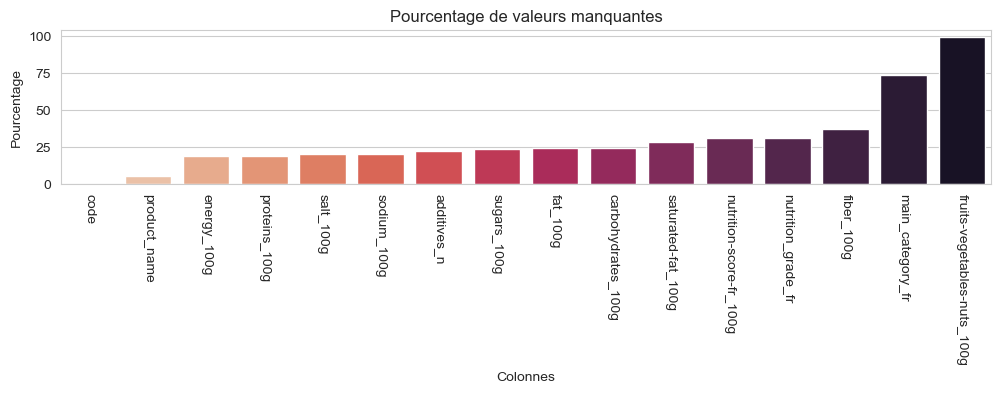

In [4]:
relevant_columns = [
     # Generalities
    "code", # barcode of the product 
    "product_name", # name of the product
    
    # Misc Data
    "additives_n", # Number of additives
    "main_category_fr", # Category of the products in FR
    
    # Nutri-Score
    "nutrition-score-fr_100g", #  Nutrition score derived from the UK FSA score and adapted for the French market
    "nutrition_grade_fr", # nutrition grade ('a' to 'e')
    
    # Nutrition facts for nutri-score
    "energy_100g",
    "saturated-fat_100g",
    "sugars_100g",
    "salt_100g",
    "sodium_100g",
    "fruits-vegetables-nuts_100g",
    "fiber_100g",
    "proteins_100g",

    # Others nutrition facts that seems relevant for food health
    "carbohydrates_100g",
    "fat_100g",
]
products_relevant = products[relevant_columns].copy()
create_percentage_missing_chart(products_relevant, 1)

Je remarque que la colonne fruits-vegetables-nuts_100g à trop de valeus manquantes et ne me sera donc pas utile pour établir des analyses.  
La valeur main_category à beaucoup de valeur manquantes mais je veux voir lors de l'analyse s'il y a une logique parmis les catégories existantes.

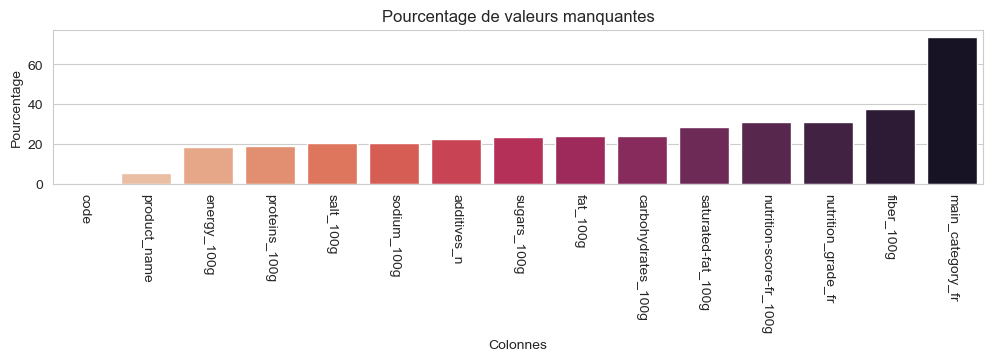

In [5]:
products_relevant = products_relevant.drop(columns=["fruits-vegetables-nuts_100g"])
create_percentage_missing_chart(products_relevant, 1)

Puis je regarde les 30 catégories les plus utilisé.

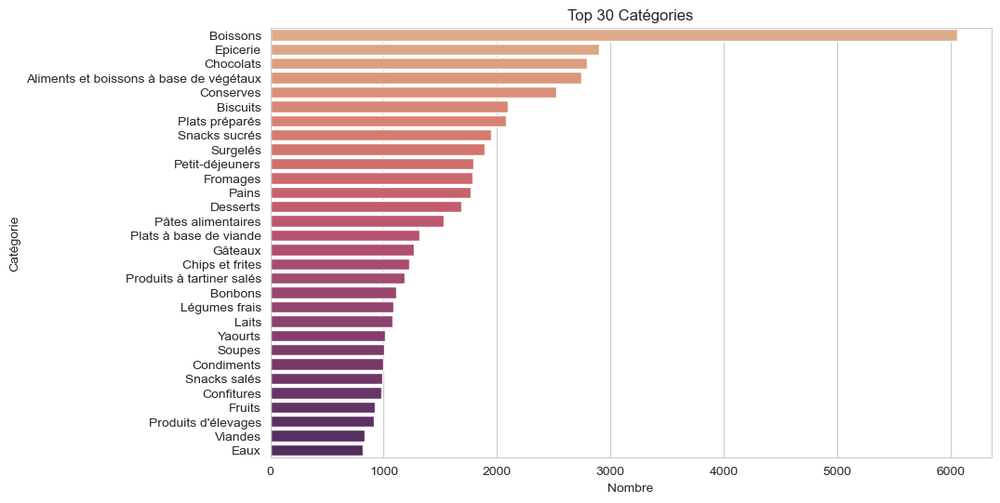

In [6]:
# Calculate the count of each category  
category_counts = products_relevant["main_category_fr"].value_counts().head(30)  

# Create a horizontal bar plot  
plt.figure(figsize=(10, 6))  
sns.barplot(x=category_counts, y=category_counts.index, palette="flare")  
  
plt.title("Top 30 Catégories")  
plt.xlabel("Nombre")  
plt.ylabel("Catégorie")  
  
# Display the plot  
plt.show()  

Un produit qui n'a pas de nom et pas de catégories ne me sera pas utile, j'observe le nombre de produits dans ce cas et je les supprimes.

In [7]:
products_without_name_and_category = products_relevant[products_relevant["product_name"].isna() & products_relevant["main_category_fr"].isna()]
print(f"Suppression de {len(products_without_name_and_category)} produits")
products_relevant = products_relevant.drop(products_without_name_and_category.index)  
print(f"Il reste {len(products_relevant)} produits")


Suppression de 16762 produits
Il reste 304010 produits


Également, tous les produits qui n'ont aucune donnée type _100g ne seront pas utile

In [8]:
quantitative_columns = ["energy_100g","sugars_100g","salt_100g","sodium_100g","fiber_100g","proteins_100g","carbohydrates_100g","fat_100g","saturated-fat_100g"]
products_without_100g = products_relevant[quantitative_columns].isna().all(axis=1)  

print(f"Suppression de {products_without_100g.sum()} produits")
products_relevant = products_relevant[~products_without_100g]
print(f"Il reste {len(products_relevant)} produits")

Suppression de 44423 produits
Il reste 259587 produits


In [9]:
products_relevant.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 259587 entries, 1 to 320771
Data columns (total 15 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   code                     259571 non-null  object 
 1   product_name             259210 non-null  object 
 2   additives_n              233819 non-null  float64
 3   main_category_fr         64202 non-null   object 
 4   nutrition-score-fr_100g  218605 non-null  float64
 5   nutrition_grade_fr       218605 non-null  object 
 6   energy_100g              258145 non-null  float64
 7   saturated-fat_100g       226982 non-null  float64
 8   sugars_100g              242255 non-null  float64
 9   salt_100g                252873 non-null  float64
 10  sodium_100g              252834 non-null  float64
 11  fiber_100g               198764 non-null  float64
 12  proteins_100g            256987 non-null  float64
 13  carbohydrates_100g       240640 non-null  float64
 14  fat_

### 2.2 Suppression des doublons

Je vérifie si il y a des doublons sur la colonne "code" uniquement et je les supprimes.
Également pour tous les produits qui n'ont pas de code.

In [10]:
print(f"Suppression de {products_relevant['code'].duplicated().sum()} doublons")
products_relevant.drop_duplicates(subset='code', keep='first', inplace=True)

print(f'Suppression de {len(products_relevant[products_relevant["code"].isna()])} produits sans code')
products_relevant = products_relevant[~products_relevant["code"].isna()]

Suppression de 15 doublons
Suppression de 1 produits sans code


### 2.3 Remplacement des valeurs manquantes ou aberrantes

Je commence déjà par remplacer toutes les valeurs manquantes de main_categories_fr et product_name en inconnu.

In [11]:
products_relevant["main_category_fr"] = products_relevant["main_category_fr"].fillna("inconnu")
products_relevant["product_name"] = products_relevant["product_name"].fillna("inconnu")

J'observe ensuite les stats de mes données quantitatives

In [12]:
products_relevant.describe()

,additives_n,nutrition-score-fr_100g,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,sodium_100g,fiber_100g,proteins_100g,carbohydrates_100g,fat_100g
count,233819.000000,218605.000000,2.581450e+05,226982.000000,242255.000000,252873.000000,252834.000000,198764.000000,256971.000000,240640.000000,240944.000000
mean,1.994012,9.161959,1.140604e+03,5.116197,15.993382,2.036248,0.801794,2.864489,7.075038,32.088139,12.706233
std,2.515889,9.052334,6.479841e+03,8.007824,22.341638,128.935349,50.765861,12.928672,8.419555,29.760621,17.576663
min,0.000000,-15.000000,0.000000e+00,0.000000,-17.860000,0.000000,0.000000,-6.700000,-800.000000,0.000000,0.000000
25%,0.000000,1.000000,3.730000e+02,0.000000,1.300000,0.063500,0.025000,0.000000,0.700000,6.000000,0.000000
50%,1.000000,10.000000,1.100000e+03,1.790000,5.710000,0.584200,0.230000,1.500000,4.760000,20.590000,5.000000
75%,3.000000,16.000000,1.674000e+03,7.140000,24.000000,1.376680,0.543000,3.600000,10.000000,58.440000,20.000000
max,31.000000,40.000000,3.251373e+06,550.000000,3520.000000,64312.800000,25320.000000,5380.000000,430.000000,2916.670000,714.290000


Je remarque des données aberrantes sur toutes les colonnes confondues. Des valeurs supérieur à 100g et des valeurs négatives.  
Je décide de supprimer tous les produits qui ont au moins une des valeurs > 100gr ou < 0gr

Pour la colonne energy_100g, la documentation explique qu'il devrait il y avoir trois colonnes energie (g, kJ et kcal).
Ici je n'en ai qu'une qui a des valeurs moyennant 1140.

D'après https://nutritionaustralia.org/fact-sheets/balancing-energy-in-and-energy-out/:

100gr d'énergie c'est au maximum 3770 kJ. (_Fat – 37.7kJ per gram_)  
3770 kJ = 901 kcal.

Étant donné que 50% on des valeurs supérieur à 1100, je continue en prenant en compte que la colonne energy_100g est en kJ.
Donc je supprime toute valeurs > 3770.

In [13]:
# len(products_relevant[products_relevant["sugars_100g"] > 100])
# all except energy 
column_100g = ["sugars_100g","salt_100g","sodium_100g","fiber_100g","proteins_100g","carbohydrates_100g","fat_100g","saturated-fat_100g"]
products_above_100g = (products_relevant[column_100g] > 100).any(axis=1)
print(f"Suppression de {len(products_relevant[products_above_100g])} produits > 100gr")
products_relevant = products_relevant[~products_above_100g]  

products_below_0g = (products_relevant[column_100g] < 0).any(axis=1)
print(f"Suppression de {len(products_relevant[products_below_0g])} produits < 0g")
products_relevant = products_relevant[~products_below_0g]  

# https://nutritionaustralia.org/fact-sheets/balancing-energy-in-and-energy-out/
products_above_3770 = (products_relevant[["energy_100g"]] > 3770).any(axis=1)
print(f"Suppression de {len(products_relevant[products_above_3770])} produits > 3770kJ")
products_relevant = products_relevant[~products_above_3770]

print(f"Il reste {len(products_relevant)} produits")

Suppression de 180 produits > 100gr
Suppression de 11 produits < 0g
Suppression de 350 produits > 3770kJ
Il reste 259030 produits


In [14]:
products_relevant.describe()

,additives_n,nutrition-score-fr_100g,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,sodium_100g,fiber_100g,proteins_100g,carbohydrates_100g,fat_100g
count,233365.000000,218321.000000,257608.000000,226565.000000,241940.00000,252345.000000,252306.000000,198482.000000,256448.000000,240183.000000,240488.000000
mean,1.996966,9.150544,1121.125408,5.084114,15.97653,1.592919,0.627229,2.835328,7.085157,32.107225,12.629608
std,2.516644,9.049184,792.117307,7.800932,21.16275,6.258827,2.464276,4.587889,8.161433,29.156584,17.317135
min,0.000000,-15.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,373.000000,0.000000,1.30000,0.063500,0.025000,0.000000,0.700000,6.000000,0.000000
50%,1.000000,10.000000,1100.000000,1.790000,5.71000,0.584200,0.230000,1.500000,4.760000,20.710000,5.000000
75%,3.000000,16.000000,1674.000000,7.140000,24.00000,1.374140,0.541000,3.600000,10.000000,58.500000,20.000000
max,31.000000,40.000000,3770.000000,100.000000,100.00000,100.000000,39.370079,100.000000,100.000000,100.000000,100.000000


Ensuite j'observe les outliers de la colonne additives_n afin de supprimer les outliers

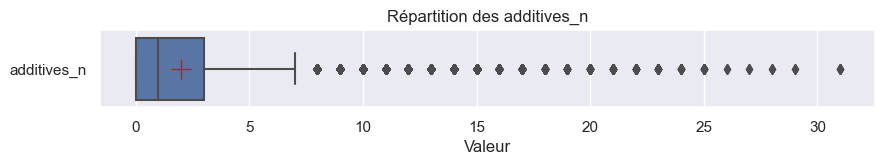

In [15]:
sns.set(rc={"figure.figsize":(10,1)})
sns.boxplot(data=products_relevant[["additives_n"]], orient="h", showfliers=True, showmeans=True, meanprops={"markeredgecolor": 'red', "marker": "+", "markersize": 15})  
plt.title("Répartition des additives_n")  
plt.xlabel("Valeur")  
plt.show()

Je supprime les outliers

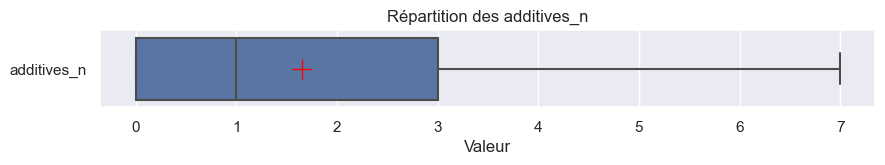

Il y a 10% de valeurs null restante


In [16]:
# Calculate the IQR (Interquartile Range)
Q1 = products["additives_n"].quantile(0.25)
Q3 = products["additives_n"].quantile(0.75)
IQR = Q3 - Q1

# Define the upper and lower bounds for outliers
lower_bound = Q1 - 1.5 * IQR # It's negative here, useless but I keep it for future usage
upper_bound = Q3 + 1.5 * IQR

# Count the outlier
product_additives_n_outlier = products_relevant[(products_relevant["additives_n"] < lower_bound) | (products_relevant["additives_n"] > upper_bound)]
# product_additives_n_outlier = product_additives_n_outlier.reset_index(drop=True)  

# print(f"Suppression de {len(product_additives_n_outlier)} produits")
products_relevant = products_relevant.drop(product_additives_n_outlier.index)

# Create a new array without the outlier
# Display the boxplot
sns.boxplot(data=products_relevant[["additives_n"]], orient="h", showfliers=True ,showmeans=True, meanprops={"markeredgecolor": 'red', "marker": "+", "markersize": 15})  
plt.title("Répartition des additives_n")  
plt.xlabel("Valeur")  
plt.show()

print(f'Il y a {round(products_relevant["additives_n"].isna().mean() * 100)}% de valeurs null restante')

In [17]:
products_relevant.isnull().mean() * 100

code                        0.000000
product_name                0.000000
additives_n                10.284100
main_category_fr            0.000000
nutrition-score-fr_100g    15.685206
nutrition_grade_fr         15.685206
energy_100g                 0.563392
saturated-fat_100g         12.422263
sugars_100g                 6.727841
salt_100g                   2.631031
sodium_100g                 2.645857
fiber_100g                 23.251723
proteins_100g               1.011380
carbohydrates_100g          7.530053
fat_100g                    7.410242
dtype: float64

KeyError: "['salt_100g'] not in index"

<Figure size 1000x600 with 0 Axes>

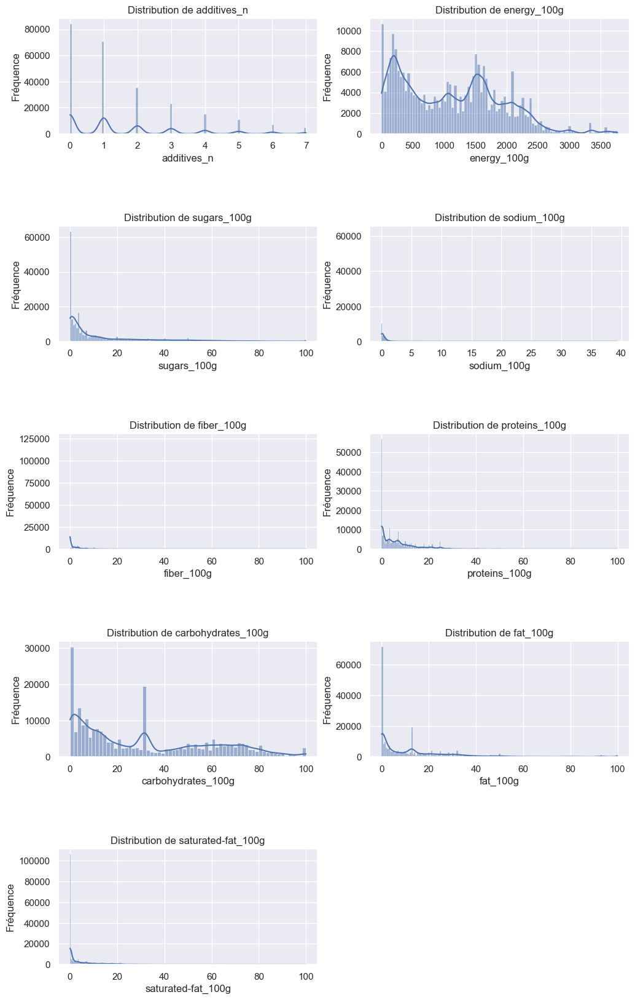

<Figure size 1000x600 with 0 Axes>

In [36]:
# Plot the missing data
def visualize_missing_data(df):
    plt.figure(figsize=(10, 6))
    products_quantity = df[["additives_n","energy_100g","sugars_100g","sodium_100g","fiber_100g","proteins_100g","carbohydrates_100g","fat_100g","saturated-fat_100g"]]
    missing_data = products_quantity.isnull().mean()

    num_cols = len(products_quantity.columns)  
    num_rows = math.ceil(num_cols / 2)  

    fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(12, 20))
    plt.subplots_adjust(hspace=0.8)  

    # Flatten the axes array  
    axes = axes.flatten()  
    # Plot the distribution of each column  
    for i, column in enumerate(products_quantity.columns):  
        ax = axes[i]  
        sns.histplot(products_quantity[column].dropna(), kde=True, ax=ax)  
        ax.set_xlabel(column)  
        ax.set_ylabel('Fréquence')  
        ax.set_title('Distribution de {}'.format(column))  

    # Hide empty subplots  
    if num_cols % 2 != 0:  
        axes[-1].axis('off')

visualize_missing_data(products_relevant)


# Check for correlations between missing values  
plt.figure(figsize=(10, 6))  
sns.heatmap(products_relevant[quantitative_columns].notna().corr(method='spearman'), cmap='coolwarm', annot=True)  
plt.title('Corrélation entre données manquantes')  
plt.show()

En observant les projections je remarque qu'il n'y a pas de normalité pour chaque distributions.

J'observe que la colonne additives_n et energy_100g est plutôt uniforme avec un nombre important de valeurs manquantes vers la fin. Je considère de remplacer ces valeurs par la médiane pour maintenir l'intégrité des données.

Pour la colonne carbohydrates_100g et fat_100g il y a une correlation, je vais faire une imputation KNN.

Pour la colonne nutrition-score-fr-100g je ne suis pas encore certain.

La colonne salt est en double avec sodium, je supprime la colonne salt.

Pour le reste, on est sur des courbes de type "reverse J-shaped curve" (courbe en forme de J inversée) avec une forte valeur sur à 0 puis une rapide courbe plate, je les mets à 0.

In [19]:
# Replace NaN values in column "additives_n" with median  
median_additives = products_relevant["additives_n"].median()  
products_relevant["additives_n"].fillna(median_additives, inplace=True) 

# Replace NaN values in column "energy_100g" with median  
median_energy = products_relevant["energy_100g"].median()  
products_relevant["energy_100g"].fillna(median_energy, inplace=True) 

products_relevant = products_relevant.drop(columns=["salt_100g"]);


In [20]:
# I need to find a way to calculate the best NN and choose this one instead of just putting 5.
imputer = KNNImputer(n_neighbors=5) 
columns = ["carbohydrates_100g","fat_100g"]
products_relevant[columns] = imputer.fit_transform(products_relevant[columns])  

In [21]:
columns = ["sugars_100g","sodium_100g","fiber_100g","proteins_100g","saturated-fat_100g"]
products_relevant[columns] = products_relevant[columns].fillna(0)
products_relevant.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 249560 entries, 1 to 320771
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   code                     249560 non-null  object 
 1   product_name             249560 non-null  object 
 2   additives_n              249560 non-null  float64
 3   main_category_fr         249560 non-null  object 
 4   nutrition-score-fr_100g  210416 non-null  float64
 5   nutrition_grade_fr       210416 non-null  object 
 6   energy_100g              249560 non-null  float64
 7   saturated-fat_100g       249560 non-null  float64
 8   sugars_100g              249560 non-null  float64
 9   sodium_100g              249560 non-null  float64
 10  fiber_100g               249560 non-null  float64
 11  proteins_100g            249560 non-null  float64
 12  carbohydrates_100g       249560 non-null  float64
 13  fat_100g                 249560 non-null  float64
dtypes: f

<Figure size 1000x600 with 0 Axes>

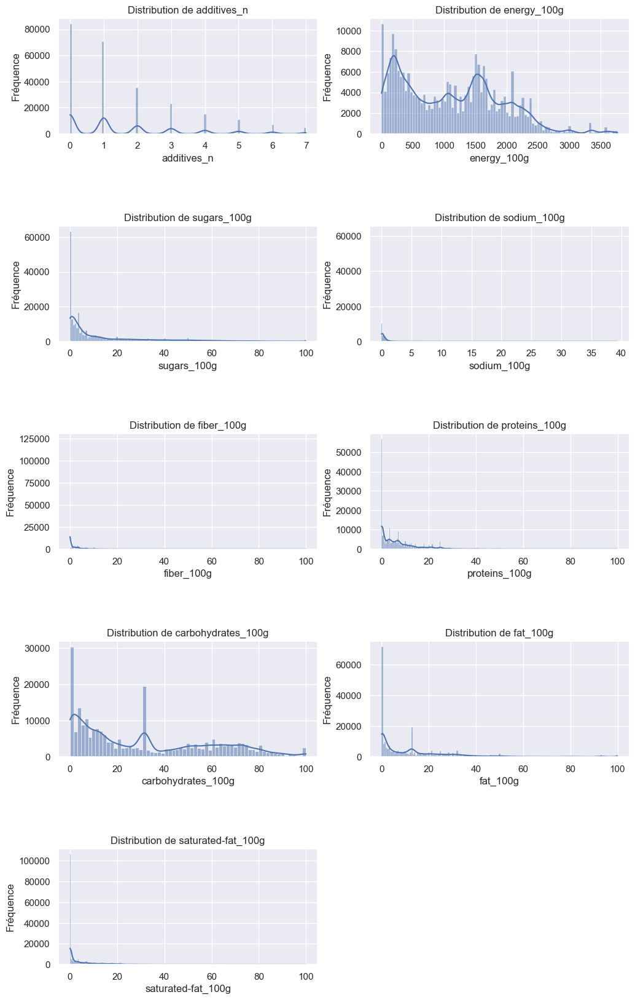

In [22]:
visualize_missing_data(products_relevant)


## 3. Analyse

---

In [35]:
import numpy as np
import pandas as pd
import time

# For plotting
import plotly.io as plt_io
import plotly.graph_objects as go
%matplotlib inline

#PCA
from sklearn.decomposition import PCA
#TSNE
from sklearn.manifold import TSNE
#UMAP
import umap as umap
#LDA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA


In [24]:
test_data_clean = products_relevant.copy()
test_data_clean.dropna(subset=["nutrition_grade_fr"], inplace=True)  
test_data_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 210416 entries, 1 to 320768
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   code                     210416 non-null  object 
 1   product_name             210416 non-null  object 
 2   additives_n              210416 non-null  float64
 3   main_category_fr         210416 non-null  object 
 4   nutrition-score-fr_100g  210416 non-null  float64
 5   nutrition_grade_fr       210416 non-null  object 
 6   energy_100g              210416 non-null  float64
 7   saturated-fat_100g       210416 non-null  float64
 8   sugars_100g              210416 non-null  float64
 9   sodium_100g              210416 non-null  float64
 10  fiber_100g               210416 non-null  float64
 11  proteins_100g            210416 non-null  float64
 12  carbohydrates_100g       210416 non-null  float64
 13  fat_100g                 210416 non-null  float64
dtypes: f

In [25]:
test_data_clean['nutrition_grade_fr_n'] = test_data_clean['nutrition_grade_fr'].replace({'a': 1, 'b': 2, 'c': 3, 'd': 4, 'e': 5})

test_data_sampled = test_data_clean.sample(frac=0.05, random_state=42)  
len(test_data_sampled)


10521

In [26]:
# Setting the label and the feature columns
y = test_data_sampled.loc[:,'nutrition_grade_fr_n'].values
x = test_data_sampled[["additives_n","energy_100g","sugars_100g","sodium_100g","fiber_100g","proteins_100g","carbohydrates_100g","fat_100g","saturated-fat_100g","nutrition-score-fr_100g"]].values


In [27]:
def plot_2d(component1, component2):
    
    fig = go.Figure(data=go.Scatter(
        x = component1,
        y = component2,
        mode='markers',
        marker=dict(
            size=20,
            color=y, #set color equal to a variable
            colorscale='Rainbow', # one of plotly colorscales
            showscale=True,
            line_width=1
        )
    ))
    fig.update_layout(margin=dict( l=100,r=100,b=100,t=100),width=1200,height=700)                 
    fig.layout.template = 'plotly_dark'
    
    fig.show()

In [28]:
def plot_3d(component1,component2,component3):
    fig = go.Figure(data=[go.Scatter3d(
        x=component1,
        y=component2,
        z=component3,
        mode='markers',
        marker=dict(
            size=10,
            color=y,                # set color to an array/list of desired values
            colorscale='Rainbow',   # choose a colorscale
            opacity=1,
            line_width=1
        )
    )])
    # tight layout
    fig.update_layout(margin=dict(l=50,r=50,b=50,t=50),width=1200,height=700)
    fig.layout.template = 'plotly_dark'
    
    fig.show()

In [29]:
start = time.time()
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(x)
print('Duration: {} seconds'.format(time.time() - start))
principal = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2','principal component 3'])

Duration: 0.03942990303039551 seconds


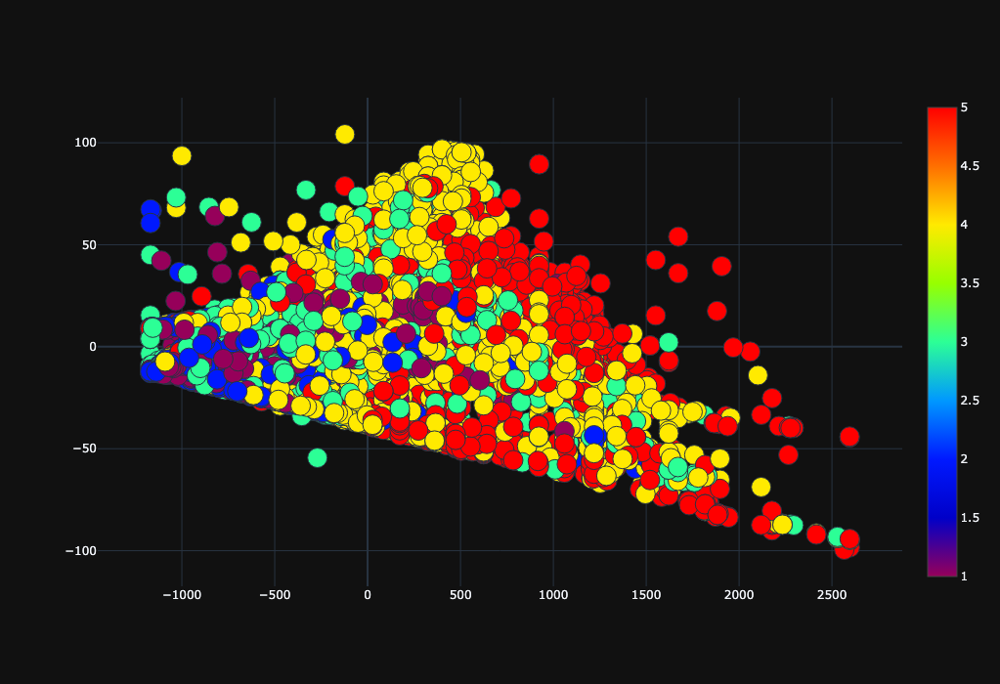

In [30]:
plot_2d(principalComponents[:, 0],principalComponents[:, 1])

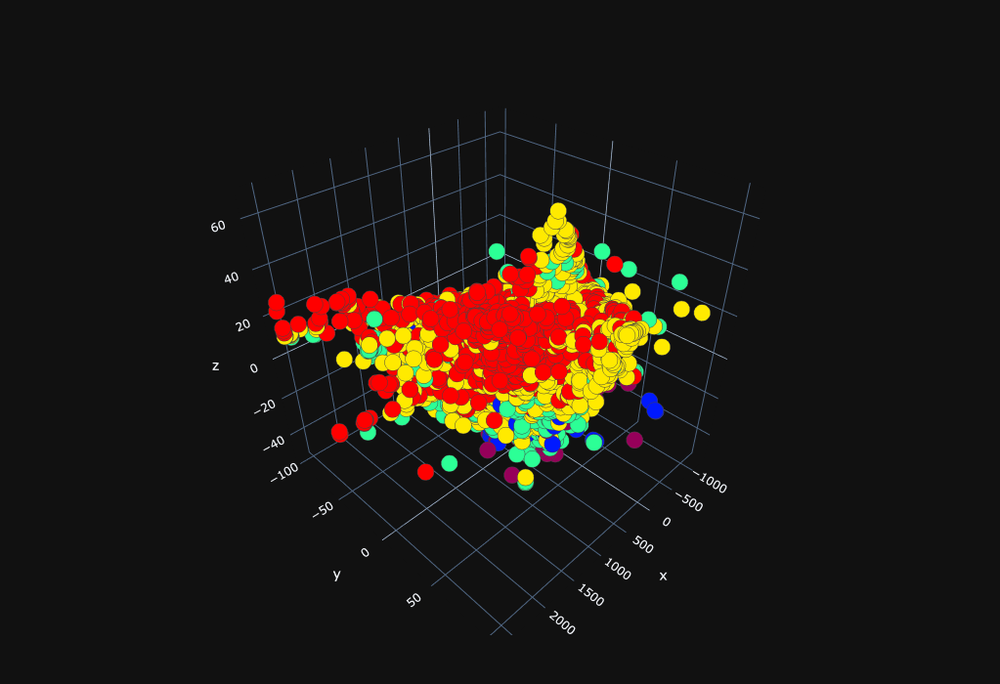

In [31]:
plot_3d(principalComponents[:, 0],principalComponents[:, 1],principalComponents[:, 2])

In [32]:
start = time.time()
X_LDA = LDA(n_components=3).fit_transform(x,y)
print('Duration: {} seconds'.format(time.time() - start))

Duration: 0.03730201721191406 seconds


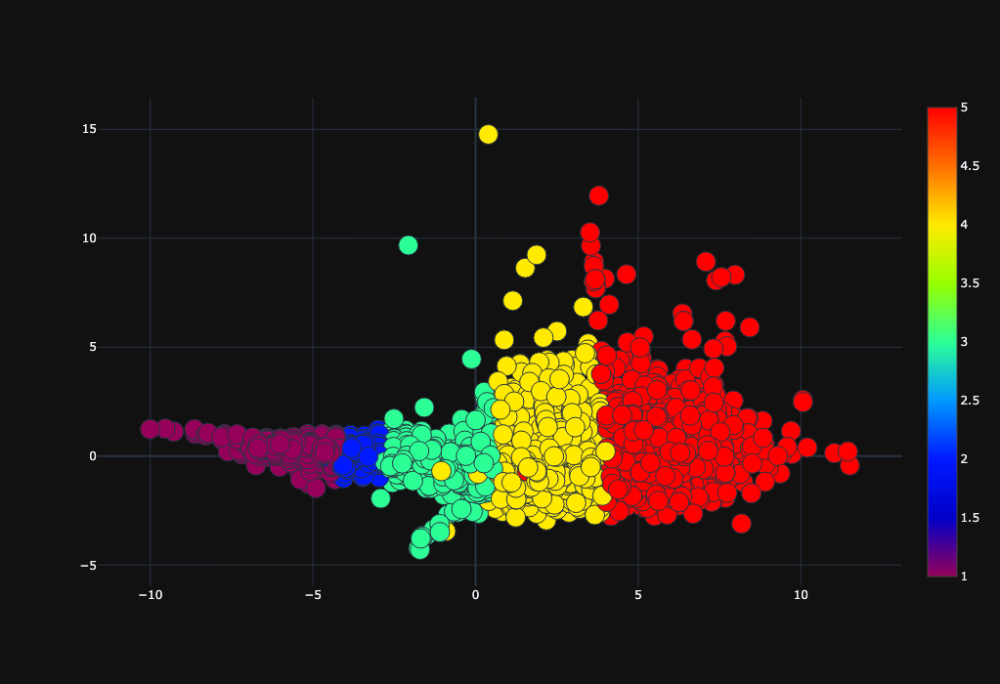

In [33]:
plot_2d(X_LDA[:, 0],X_LDA[:, 1])

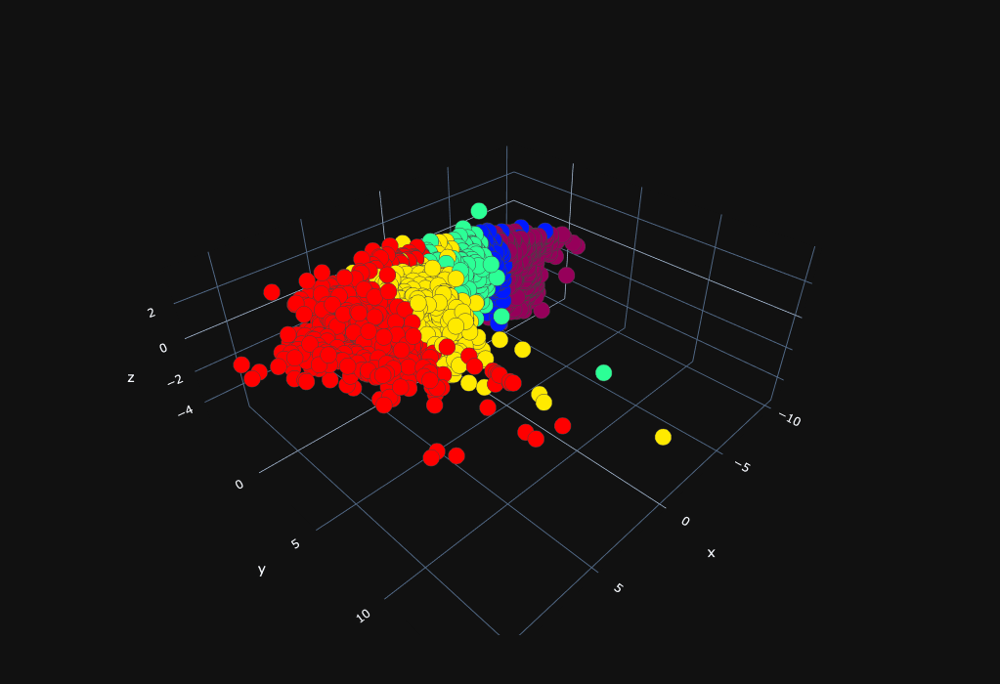

In [34]:
plot_3d(X_LDA[:, 0],X_LDA[:, 1],X_LDA[:, 2])